.## Problem statement

<b>To build a Generative adversarial model(modified U-Net) which can generate artificial MRI images of different contrast levels from existing MRI scans<b>

In [ ]:
!nvidia-smi

In [ ]:
# Install all the necessary libraries
!pip install matplotlib
!pip install scikit-image
!pip install glob
!pip install keras
!pip install imageio

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from skimage.transform import resize
import imageio
import glob
import os

### Data Loading

In [ ]:
t1_path = "/home/amlan/Documents/Git_Repos/Upgrad/Capstone/MRI+T1_T2+Dataset/Tr1/TrainT1"
t2_path = "/home/amlan/Documents/Git_Repos/Upgrad/Capstone/MRI+T1_T2+Dataset/Tr2/TrainT2"

t1_images = os.listdir(t1_path)
t2_images = os.listdir(t2_path)
# Validating filename extraction
t1_images[2]

'Image #35.png'

In [ ]:
# Checking how an image looks like as a numpy array
imageio.imread(t1_path+ '/' + t1_images[2])

In [ ]:
# Definition to read and extract t1 and t2 train images
# Returns a numpy array
def extract_images(ospath, imgfolder):
    img_list = []
    for file in imgfolder:
        img = imageio.imread(ospath+ '/' + file)
        img_list.append(img)
    return np.asarray(img_list) # converts list to a numpy array

In [ ]:
# Data loading
t1 = extract_images(t1_path, t1_images)
t2 = extract_images(t2_path, t2_images)
print('T1 Shape: ',t1.shape)
print('T2 Shape: ',t2.shape)
print('Dataset size: ', t1.shape[0]+t2.shape[0])

T1 Shape:  (43, 217, 181)
T2 Shape:  (46, 217, 181)
Dataset size:  89


It can bee seen that the number of images is very less for conventional training but an important advantage of GANs is its ability to generate images and create datasets out of it. Hence, instead of data augmentation, increasing the number of epochs should be fine.

### Data Visualization


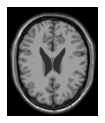

In [ ]:
# Visualizing t1 image
plt.figure(figsize=(2, 2))
plt.imshow(t1[2], cmap='gray')
plt.axis('off')
plt.show()

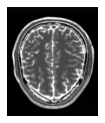

In [ ]:
# VIsualizing t2 image
plt.figure(figsize=(2, 2))
plt.imshow(t2[2], cmap='gray')
plt.axis('off')
plt.show()

### Data Preprocessing

In [ ]:
# Definition to normalize image
def normalize(img):
    img = (img/127.5)-1.0 # Normalize the images to [-1.0, 1.0]
    return img

In [ ]:
# Normalizing t1 and t2 images
t1 = normalize(t1)
t2 = normalize(t2)

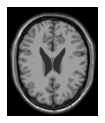

In [ ]:
# Visualizing t1 image
plt.figure(figsize=(2, 2))
plt.imshow(t1[2], cmap='gray')
plt.axis('off')
plt.show()

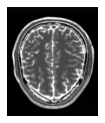

In [ ]:
# Visualizing t2 image
plt.figure(figsize=(2, 2))
plt.imshow(t2[2], cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
# Resizing images to (64,64)
def resize_img(imgs):
    img_resized = np.zeros((imgs.shape[0], 64, 64))
    for index, img in enumerate(imgs):
        img_resized[index, :, :] = resize(img, (64, 64))
    return img_resized

In [ ]:
t1_resized = resize_img(t1)
t2_resized = resize_img(t2)
print('T1 Shape: ',t1_resized.shape)
print('T2 Shape: ',t2_resized.shape)

T1 Shape:  (43, 64, 64)
T2 Shape:  (46, 64, 64)


In [ ]:
# Reshape Images to (64, 64, 1) with float pixel values
t1_resized = t1_resized.reshape(t1_resized.shape[0], 64, 64, 1).astype('float32')
t2_resized = t2_resized.reshape(t2_resized.shape[0], 64, 64, 1).astype('float32')

In [ ]:
# Batch and shuffle data
BATCH_SIZE = 32
t1_resized = tf.data.Dataset.from_tensor_slices(t1_resized).shuffle(t1.shape[0], seed=42).batch(BATCH_SIZE)
t2_resized = tf.data.Dataset.from_tensor_slices(t2_resized).shuffle(t2.shape[0], seed=42).batch(BATCH_SIZE)

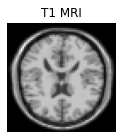

In [ ]:
# Randomly visualizing resized images
t1_sample = next(iter(t1_resized))
plt.figure(figsize=(2, 2))
plt.imshow(t1_sample[0].numpy()[:, :, 0], cmap='gray')
plt.title('T1 MRI')
plt.axis('off')
plt.show()

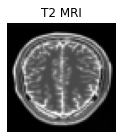

In [ ]:
t2_sample = next(iter(t2_resized))
plt.figure(figsize=(2, 2))
plt.imshow(t2_sample[0].numpy()[:, :, 0], cmap='gray')
plt.title('T2 MRI')
plt.axis('off')
plt.show()

### Model Building & Training

In [ ]:
# Class to implement instant normalization on images
class InstanceNormalization(tf.keras.layers.Layer):
    # Initialization of Objects
    def __init__(self, epsilon=1e-5):
        # calling parent's init
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)

    def call(self, x):
        # Compute Mean and Variance, Axes=[1,2] ensures Instance Normalization
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

In [ ]:
# Downsampling method: Leads to reduction in dimensions, achieved with convolutions
def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Conv2d layer
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    # Add Normalization layer
    if apply_norm:
        result.add(InstanceNormalization())
    # Add Leaky Relu Activation
    result.add(tf.keras.layers.LeakyReLU())
    return result

In [ ]:
# Upsampling method: Achieved with Conv2DTranspose
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Transposed Conv2d layer
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    # Add Normalization Layer
    result.add(InstanceNormalization())
    # Conditionally add Dropout layer
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    # Add Relu Activation Layer
    result.add(tf.keras.layers.ReLU())
    return result

In [ ]:
# Unet Generator: A combination of Convolution + Transposed Convolution Layers
def unet_generator():
    down_stack = [
        downsample(128, 4, False), # (bs, 32, 32, 128)
        downsample(256, 4), # (bs, 16, 16, 256)
        downsample(256, 4), # (bs, 8, 8, 256)
        downsample(256, 4), # (bs, 4, 4, 256)
        downsample(256, 4), # (bs, 2, 2, 256)
        downsample(256, 4) # (bs, 1, 1, 256)
    ]
    up_stack = [
        upsample(256, 4, True), # (bs, 2, 2, 256)
        upsample(256, 4, True), # (bs, 4, 4, 256)
        upsample(256, 4), #(bs, 8, 8, 256)
        upsample(256, 4),# (bs, 16, 16, 256)
        upsample(128, 4) # (bs, 32, 32, 128)
    ]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(1, 4, strides=2, padding='same', kernel_initializer=initializer,
                                           activation='tanh') # (bs, 64, 64, 1)
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=[64, 64, 1])
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

#### Creating generator

In [ ]:
generator_g = unet_generator()
generator_f = unet_generator()

In [ ]:
generator_g.summary()

#### Creating Discriminator

In [ ]:
# Discriminators only contain Convolutional Layers and no Transposed Convolution is used
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    # add input layer of size (64, 64, 1)
    inp = tf.keras.layers.Input(shape=[64, 64, 1], name='input_image')
    x = inp

    # add downsampling step here
    down1 = downsample(128, 4, False)(x) # (bs, 32, 32, 128)
    down2 = downsample(256, 4)(down1) # (bs, 16, 16, 128)
    # add a padding layer here
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down2) # (bs, 18, 18, 256)

    # implement a concrete downsampling layer here
    conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1) # (bs, 15, 15, 512)
    norm1 = InstanceNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)

    # apply zero padding layer
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 17, 17, 512)

    # add a last pure 2D Convolution layer
    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 14, 14, 1)
    return tf.keras.Model(inputs=inp, outputs=last)

In [ ]:
discriminator_x = discriminator()
discriminator_y = discriminator()

In [ ]:
discriminator_x.summary()

### Model Training

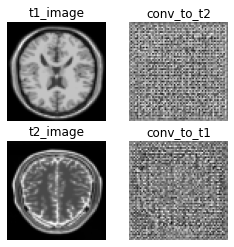

In [ ]:
# Verify output of untrained Generator models which should be a random noise
conv_to_t2 = generator_g(t1_sample)
conv_to_t1 = generator_f(t2_sample)
plt.figure(figsize=(4, 4))

imgs = [t1_sample, conv_to_t2, t2_sample, conv_to_t1]
title = ['t1_image', 'conv_to_t2', 't2_image', 'conv_to_t1']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    plt.imshow(imgs[i][0].numpy()[:, :, 0], cmap='gray')
    plt.axis('off')
plt.show()

#### Creating loss objects and functions

In [ ]:
# Classification loss of discriminator: BCE Loss
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
# Discriminator Loss: Real Loss + Fake Loss)
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5 # mean of losses

In [ ]:
# Generator Loss: Discriminator loss on generated data
def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

In [ ]:
# Cycle Loss: When we use both of Generators sequentially on a Input Image, we get Cycle Image and
# the L1 Loss between these two is called Cycle Loss.
def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return 10.0 * loss1

In [ ]:
# Identity Loss: When we provide input image to the Generator such that no translation is needed
# because the image is already transformed, here also we take L1 Loss between Input and Output Image.
def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return 0.5*loss

In [ ]:
# Leveraging Adam Optimizer to smoothen gradient descent
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
# Training model for 300 epochs
EPOCHS = 300

#### Checkpoint Initialization

In [ ]:
# Initialize checkpoints to save models
checkpoint_path = "./Trained_Model"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=3)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

In [ ]:
# Definition to show generated output whilst training
def generate_images(model1, test_input1, model2, test_input2):
    prediction1 = model1(test_input1)
    prediction2 = model2(test_input2)
    plt.figure(figsize=(8, 4))
    display_list = [test_input1[0], prediction1[0], test_input2[0], prediction2[0]]
    title = ['Input Image', 'Generated Image', 'Input Image', 'Generated Image']
    for i in range(4):
        plt.subplot(1, 4, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i].numpy()[:, :, 0], cmap='gray')
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

#### Defining Training Function

In [ ]:
@tf.function
def train_step(real_x, real_y):
    # persistent is set to True because the tape is used more than
    # once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator G translates X -> Y
        # Generator F translates Y -> X
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)

        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        # same_x and same_y are used for identity loss.
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)

        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)

        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)

        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

        # Total generator loss = BCE loss + cycle loss + identity loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

        # Discriminator's loss
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

    # Calculate the gradients for generator and discriminator
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)

    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)

    # Apply the gradients to the optimizer
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))

    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))

In [ ]:
# Verify if GPU is set as the default device for training
tf.compat.v1.Session(config=tf.compat.v1.ConfigProto(log_device_placement=True))

Device mapping:
/job:localhost/replica:0/task:0/device:GPU:0 -> device: 0, name: GeForce RTX 3080, pci bus id: 0000:09:00.0, compute capability: 8.6



### Training the CycleGAN

In [ ]:
%%time
for epoch in range(1, EPOCHS+1):
    for image_x, image_y in tf.data.Dataset.zip((t1_resized, t2_resized)):
        train_step(image_x, image_y)
    generate_images(generator_g, t1_sample, generator_f, t2_sample)
    ckpt_save_path = ckpt_manager.save()
    print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)

### Generating GIF to VIsualize Results

In [ ]:
anim_file = 'cyclegan_mri.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

!pip install git+https://github.com/tensorflow/docs


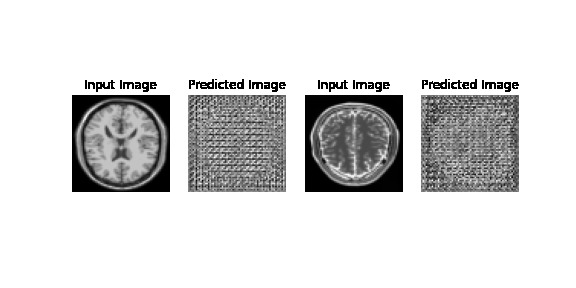

In [ ]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)